# Basic Statistics

## Package import

All needed packages are imported below

In [32]:
import pandas as pd
import numpy as np
import networkx as nx 
import pickle
import itertools
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
#from svgpathtools import svg2paths
#from svgpath2mpl import parse_path
import matplotlib as mpl
from operator import itemgetter
import seaborn as sns
sns.set()
from fa2 import ForceAtlas2
from community import community_louvain

## Get data

First we load the needed data. The three loaded data sets are:

1) Handle data which includes the twitter handles and the following attributies:
- State
- Party (note we change from abbreviation to full Party name)
- Type (senator, representative or potus)
- Name

2) Following adjacency matrix. The directer adjancency matrix of who follows who on Twitter

3) Dictionary of the total number of following per twitter user.

In [33]:
# Load data on all congress-members
Handle_data = pd.read_csv('../Data/Processed/Twitter_Handles.csv', index_col=0).set_index('Twitter')
Handle_data['Party'] = Handle_data['Party'].map({'R': 'Republican', 'D': 'Democrat', 'I': 'Independent', 'L': 'Libertarian'})

# Get Adjajency matrix
Follow_df = pd.read_csv('../Data/Processed/Follow_df.csv', index_col=0)

# Get dictionary of the total number of following for all persons in the data st
with open('../Data/Processed/No_follow_dict.pickle', 'rb') as handle:
    No_follow_dict = pickle.load(handle)

Now the graph is created as a directed graph from the adjancency matrix. The Twitter-handles are also set as the node names.

In [34]:
# Create graph
G = nx.from_numpy_matrix(Follow_df.values, create_using=nx.DiGraph())

# Because we use numpy, labels need to be reset
label_mapping = {idx: val for idx, val in enumerate(Follow_df.columns)}
G = nx.relabel_nodes(G, label_mapping)

## Attributes and isolates

The `Handle_data` as well as the `No_follow_dict` contains info for each person via their Twitter handle. These can be seen as attributes why they are added as node attributes for the graph. The same is the case for the total number of following.

In [35]:
# Add atributes
for node in G.nodes:
    # Other info from data set
    G.nodes[node].update(Handle_data.loc[node].to_dict())

    # Number of total following 
    G.nodes[node].update({"Total_follow": No_follow_dict[node]})

In the graph nodes can be isoltaed if they are not following anyone else and do not have any followers from the data set. There can be multiple reasons for this. Maybe there was an error in the data and Twitter handlers corresponds to another person. If can also be the case that it is a person from the 115$^{\text{th}}$ congress who were not reelected - afterwards they might closed their Twitter and their handle has then be taken by someone else. 

The isolated nodes are not deemed relevant for this graph why they are removed below:

In [36]:
# Get isolates
nodes_to_remove = list(nx.isolates(G))

# Remove isolates
G.remove_nodes_from(nodes_to_remove)

# Show how many are removed
print(f"{len(nodes_to_remove)} nodes removed as they are isolates")

3 nodes removed as they are isolates


As it can be seen 7 nodes are removed. This is not a significant figure why this is not something that should be a problem and wor is continued on the resulting graph.

## Basic stats of the graph

Let's first have a look at the total nodes, which is done with the `.nodes` method from Networkx.

In [37]:
# Nodes
print(f'The graph has {len(G.nodes)} nodes in total')

The graph has 615 nodes in total


So there is a total of 615 nodes. Let's investigate those a bit closer based on the available attributes.

## Edges

Let's move onto investigating the edges in the network. As a reminder, an edge from node A til node B means that the politician corresponding to node A follows the politician from node B. The total number of follows within the network corresponds to the total number of edges which is:

In [38]:
# Edges
print(f'There are a total of {len(G.edges)} edges in the data set.')

There are a total of 83778 edges in the data set.


So with that many nodes the network can definitly be consideres *dense* as each politician follows $83254/610 \approx 136$ of the other politicians corresponding to around 22%. Following this info it will be investigated if patterns can be seen in who follows who.

### Follows by party

First let's see if there is some patterns based on party members. This will be done by aggregating the number of follows on a party-level which then will result in a 4x4-matrix. It is generated and shown below:

In [39]:
# Who follows who
Who_follow_who_party = pd.DataFrame(data = 0, index = Handle_data.Party.unique(), columns = Handle_data.Party.unique())

# Populate dataframe
for edge in list(G.edges):
   
    Who_follow_who_party.loc[
        Handle_data.loc[edge[0], 'Party'],
        Handle_data.loc[edge[1], 'Party']
        ] += 1

# Show result
Who_follow_who_party

,Republican,Democrat,Independent,Libertarian
Republican,29359,5768,74,139
Democrat,6819,40595,258,61
Independent,53,113,2,0
Libertarian,266,269,2,0


The first thing one would probably notice by looking at the Republicans and Democrats is that they have a very clear bias towards following politicians from their own party. Allready a clear indictation of the polarisation. Looking at the two independent senators they seem to have bais towards to Democrats while the sole Libetarian seems very neutral. 

### By type

The same analysis will be carried out on the type level with the results also shown below:

In [40]:
# Who follows who
Who_follow_who_type = pd.DataFrame(data = 0, index = Handle_data.Type.unique(), columns = Handle_data.Type.unique())

# Populate dataframe
for edge in list(G.edges):
   
    Who_follow_who_type.loc[
        Handle_data.loc[edge[0], 'Type'],
        Handle_data.loc[edge[1], 'Type']
        ] += 1

# Show result
Who_follow_who_type

,Senator,Representative,POTUS
Senator,6649,4108,50
Representative,10213,62492,264
POTUS,0,2,0


Here it is very interesting to see that the senators have a clear bias towards following other senators. Even though there are around 5 times more representitative there are 1.5 follows more then other senators than representitatives. For the representitatives it seems to be more inline with the actual distribution. For both representitatives and the senators around half of the follows the President - in return he only follows 2 representitatives.

## Average shortest path length

Using the inbuilt function `average_shortest_path_length` the average shortest path between two nodes in the graph can be found which is done below:

In [41]:
nx.average_shortest_path_length(G)

1.8147877439686448

Here, a result just above 2 is found which again really emphazised how *dense* the graph is as it only takes around two steps on average to get to another node from any node.

## Out- and in degree

Based on the out and in degree fom the network it can be determined who follows the most other politicians and who has the most follows. First the number of the most followers will be found as the in-degree, where the top 10 will be extraceted. Before printing the results the Twitter handles will be converted to their actual names whioch should be more interpretable - at least if one follows American Politics.

In [42]:
# Get top 10 in
top5_in = dict(sorted(dict(G.in_degree).items(), key = itemgetter(1), reverse = True)[:10])

# Get them in terms of name instead of twitter handle
top5_in = {Handle_data.loc[handle, 'Name']: followers for handle, followers in top5_in.items()}
top5_in

{'Nancy Pelosi': 337,
 'Donald J. Trump': 314,
 'Kevin McCarthy': 313,
 'Steny H. Hoyer': 291,
 'John Lewis': 263,
 'Adam Schiff': 260,
 'Kyrsten Sinema': 258,
 'Chuck Schumer': 257,
 'Steve Scalise': 250,
 'Eric Swalwell': 248}

So the top results are not surpring and it is probably some names that most people recognize - just to go through the top five:

1) Nancy Pelosi is the speaker in the House of Representatives

2) Donald J. Trump is POTUS

3) Kenvin McCarthy serves as the Republican leader in the House of Representatives (both majority- and minority leader in the data set used.)

4) Steny H. Hoyer currently serves as the majority leader in the House of Representatives.

5) John Lewis served for 33 years in the House of Representatives untill his death in July of 2020 and has thought for civil rights and served in the leadership of the Democrats in the House.


After the top four it is also seen that the the amount of follows (from politicians) are more constant with smaller *jumps*.
Let's move on to looking at the out-degree corresponding to the number they follow:

In [43]:
# Get top 10 out
top5_out = dict(sorted(dict(G.out_degree).items(), key = itemgetter(1), reverse = True)[:10])

# Get them in terms of name
top5_out = {Handle_data.loc[handle, 'Name']: followers for handle, followers in top5_out.items()}
top5_out

{'Justin Amash': 537,
 'Matt Cartwright': 486,
 'Mark Pocan': 482,
 'Jared Golden': 472,
 'Trent Kelly': 460,
 'Ted Lieu': 432,
 'Erik Paulsen': 431,
 'Kyrsten Sinema': 426,
 'Glenn Thompson': 426,
 'Dean Heller': 424}

These names are not as recognizable as before but some slight info about the top 5 can be seen below since they were investigataed:

1) Justin Amash is the only Libitarian in the data set where little bias towards either major party was found earlier.

2) Matt Cartwright represents the Democrats in the House of Representatives and has done so since 2013.

3) Marc Pocan is also a Democrat who assumed office in the House of Representatives in 2013.

4) Jared Golden is a US veteran and Democrat in the House of Representatives.

5) Trent Kelly represents the Republicans in the House of Representatives. 

So in general it is hard to find a clear pattern except that these politicans seem to value getting lots of tweets from their colleagues in their feed.

Another possibility could be these politicians in general just follows many on Twitter. This is investigated below by looking at this correlation - it can be found below:

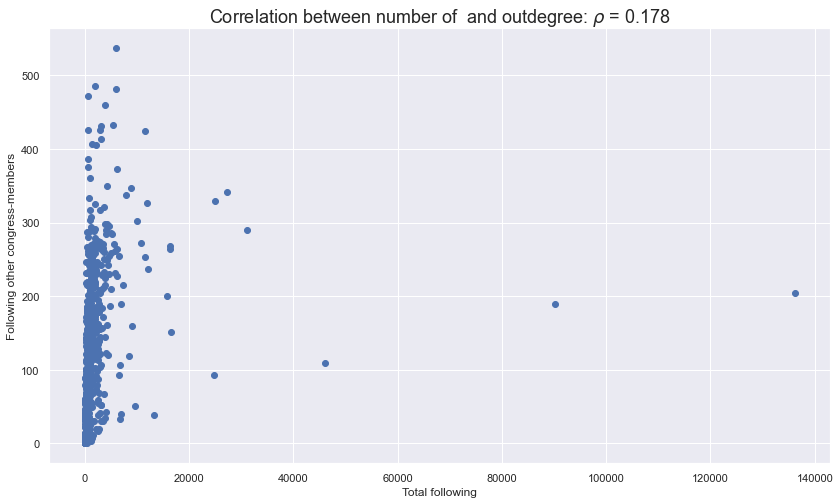

In [44]:
# Lists of length and out degree
Fol = [G.nodes[node]['Total_follow'] for node in G.nodes]
Od = [v for k,v in G.out_degree]

# Correlation coefficient
rho = np.corrcoef(Fol, Od)[1,0]

# Plot
plt.figure(figsize = (14,8))
plt.scatter(Fol,Od)
plt.title(fr'Correlation between number of  and outdegree: $\rho$ = {rho:.3f}', fontsize = 18)
plt.ylabel('Following other congress-members')
plt.xlabel('Total following')
plt.show()

The correlation look fairly low but there are also a handfull of politicians who follows extremely many. Below those with more than 20.000 following are filtered out to see how much they actual impact the results. It can be seen below:

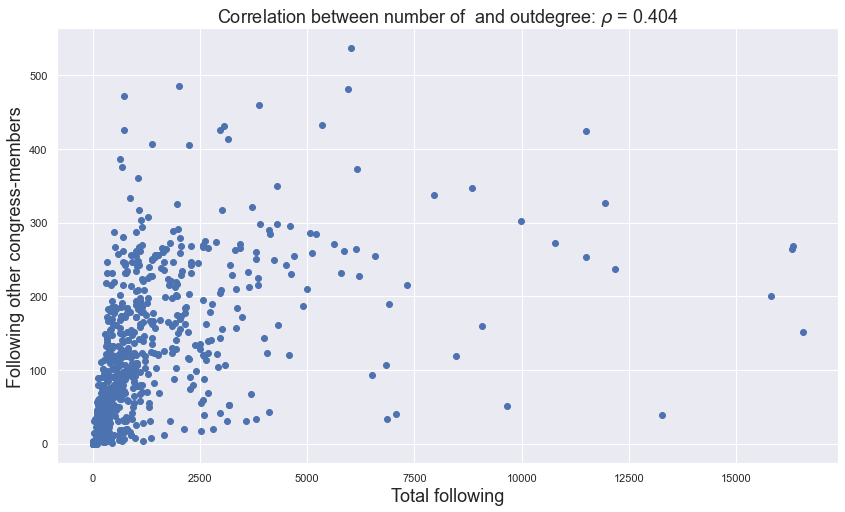

In [45]:
# New lists of length and out degree
Fol = [G.nodes[node]['Total_follow'] for node in G.nodes if G.nodes[node]['Total_follow'] <= 20000]
Od = [v for k,v in G.out_degree if G.nodes[k]['Total_follow'] <= 20000]

# Correlation coefficient
rho = np.corrcoef(Fol, Od)[1,0]

# Plot
plt.figure(figsize = (14,8))
plt.scatter(Fol,Od)
plt.title(fr'Correlation between number of  and outdegree: $\rho$ = {rho:.3f}', fontsize = 18)
plt.xlabel('Total following', fontsize = 18)
plt.ylabel('Following other congress-members', fontsize = 18)
plt.show()

So by filtering out these few nodes the correlation now reaches 40% which is clearly significant. There are though still many other factors that must account for the remaining variance. Some of it could be due to the polarisation where politicians pretty much mainly follows other politicians from their own party.

### Histograms of the in and out-degree

So far we have only looked at the top 10 and the numbers of following as a function of total following. Let's investigate the in- and out degree distribution as histograms which is done below:

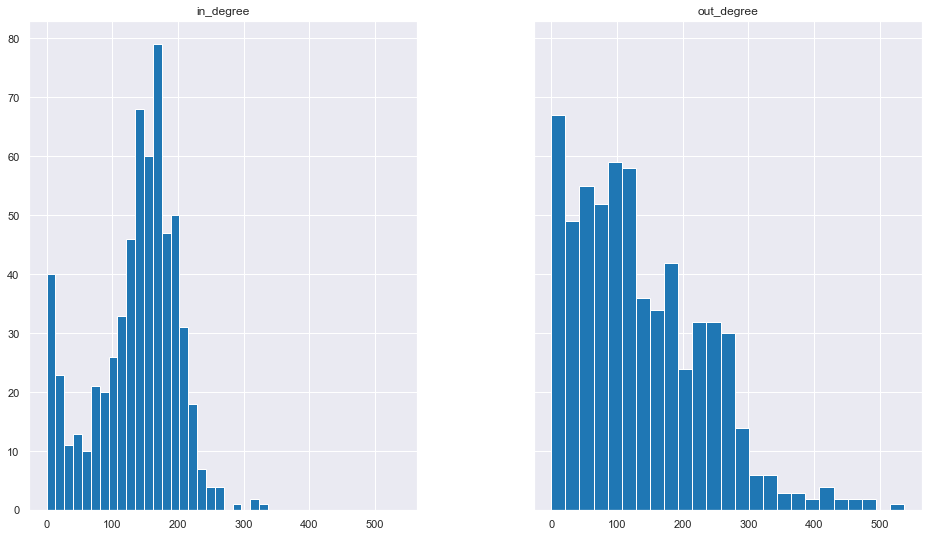

In [46]:
# Store in and out degree in datafram
degree_distribution = pd.DataFrame({
    'in_degree' : np.array(list(dict(G.in_degree).values())),
    'out_degree' : np.array(list(dict(G.out_degree).values()))
})

# Illustrate results
hist = degree_distribution[['in_degree', 'out_degree']].hist(bins=25, figsize=(16,9), color = "tab:blue", sharex = True, sharey = True)
plt.savefig('../figures/Degree_distribution.jpg', bbox_inches = 'tight', pad_inches = 0.2)

Very interesting (notice the shared axis)! It is clearly not the same distribution but stille it is not as differenct when comparing to the *Super Hero Network* that was used in class. This means that this politician-network is much more equal and there are fewer *famous* nodes. And almost all nodes seem to have at least a handfull of followers. There seem to be a spike in the first bin why it is quickly checked how many zeros there are in the in- and out degree:

In [47]:
# How many are 0?
print(f'There are {len([v for (k,v) in G.out_degree if v == 0])} who follows no one from the data set, and {len([v for (k,v) in G.in_degree if v == 0])} with no followers in the dataset.')


There are 8 who follows no one from the data set, and 6 with no followers in the dataset.


So not really anythin out of the ordinary. As the distributions are not to far from each other it is interesting to investigate th number of folliwng versus followers - maybe some of the difference is a result of how active politicians are at Twitter. This will mean that a high number of follower are correlated with a high number of following which is checked below:

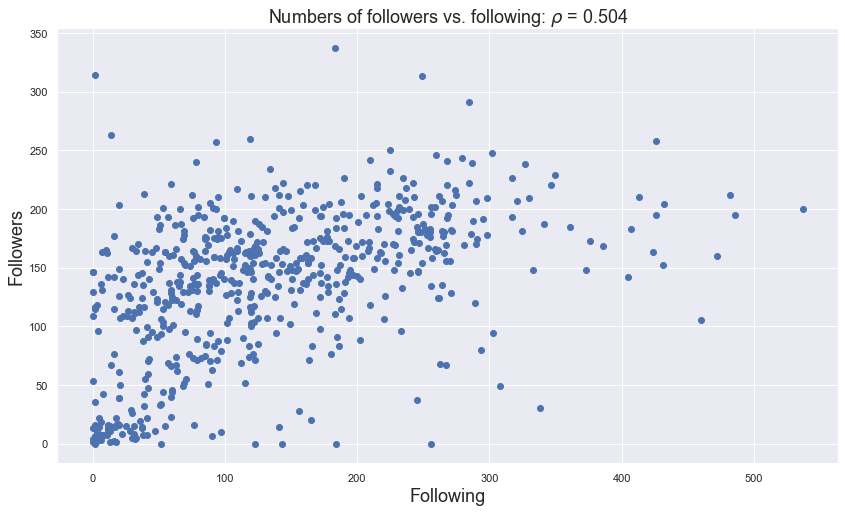

In [48]:
# Calculate correlation coefficient
rho = np.corrcoef(degree_distribution.out_degree,degree_distribution.in_degree)[1,0]

# Show plot
plt.figure(figsize = (14,8))
plt.scatter(degree_distribution.out_degree,degree_distribution.in_degree)
plt.title(fr'Numbers of followers vs. following: $\rho$ = {rho:.3f}', fontsize = 18)
plt.xlabel('Following', fontsize = 18)
plt.ylabel('Followers', fontsize = 18)
plt.show()

So it looks like there is some clear correlation - especially in the lower left part of the graph which could indicate some inactive users.



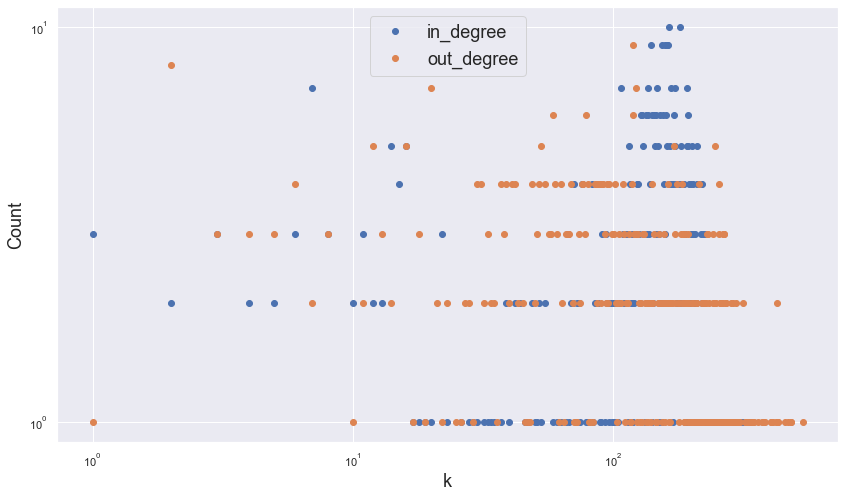

In [49]:
# Initialize plot
fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize = (14,8))
degree_distribution['in_degree'].value_counts().to_frame().plot(style='o', ax = ax1)
degree_distribution['out_degree'].value_counts().to_frame().plot(style='o', ax = ax1)
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel("k", fontsize = 18)
ax1.set_ylabel("Count", fontsize = 18)
ax1.legend(fontsize = 18)
plt.show()

### Statistics on the in- and out-degree

Last point before visualization is some basic statistics on the in and out-degree to see if it aligns with the observations abve. For this a function have been made that calculate the statistics from Pandas' describe together with the mode. It is carried out below:

In [50]:
def Calc_statistic(Graph):
    # Make data
    ID = np.array([v for k,v in Graph.in_degree])
    OD = np.array([v for k,v in Graph.out_degree])
    data = pd.DataFrame(data = np.vstack((ID, OD)).T, columns = ["In", "Out"])
    
    # Get statistics from Pandas' describe
    des = data.describe()

    # Get modes
    modes = data.mode().rename(index={0: "mode"}).iloc[0]

    # Return combined data
    return des.append(modes)

Calc_statistic(G)

,In,Out
count,615.00000,615.000000
mean,136.22439,136.224390
std,63.05012,98.803238
min,0.00000,0.000000
25%,104.50000,59.000000
50%,148.00000,119.000000
75%,179.00000,200.500000
max,337.00000,537.000000
mode,164.00000,120.000000


So the story is the same. The out-degree varies much more than the in-degree. To interpret this it corresponds to the fact that the varying part is how many a politician follows while they can be fairly certain to have a good handfull of followers from the Congress if they use Twitter. 

# Visualisation of the Graph

Now we get to the exiting part - visualising the graph. For illustrating puporses the graph is converted to a binary undirected graph where it requires mutual follows between two politicians for a link to appear. This version of the graph is created below:

In [51]:
# Initialize graph
UG = nx.Graph()

# Add nodes from directed graph
UG.add_nodes_from(G.nodes(data=True))

# Add edjes
UG_edge_list = [(i,j) for (i,j) in list(itertools.combinations(G.nodes, 2)) if (i,j) in G.edges and (j,i) in G.edges]
UG.add_edges_from(UG_edge_list)

# Get status
print(f'{len(UG.edges)} edges remain.')

24950 edges remain.


As it can be seen 24950 edges remains. This corresponds to $24882\cdot 2 = 49900$ edges in the original graph so this tells that in the majority of cases in the directed graph links are *mutual*. Still, many links have been removed which could hace created new isolates. Those are removed below:

In [52]:
# Get isolates
isolates = list(nx.isolates(UG))

# Remove them
UG.remove_nodes_from(isolates)

# Get status
print(f'Removed {len(G.nodes)-len(UG.nodes)} nodes. {len(UG.nodes)} nodes remain.')

Removed 20 nodes. 595 nodes remain.


So now 595 nodes remains and it can this be deducted that the average degree in this graph is $2\cdot 24960/595 \approx 84$.

## Options for the graph

Now the options for the individual nodes and edges will be specified so the graph can look as good as possible and contain a lot of information. To start of with the nodes size is defined as the degree of the node in the undirected version of the graph where any link (even if it only goes one way) is counted.

In [53]:
# Node size
tmpG = G.to_undirected()
tmpG.remove_nodes_from(isolates)
node_size = [Degree for Key, Degree in tmpG.degree]

For the node color the color of the respective parties are used based on the color dictionary defined earlier.

In [54]:
# Node colors
node_color = [color_dict_party[v] for k,v in nx.get_node_attributes(UG,'Party').items()]

For the edge color it is based on the two nodes it links. Links between two republicans are set to orange, links between to democrats becomes cyan while links connecting democrats and republicans are set to purple. Any link from a independent or libertarian is gray or yellow respectively. This is implemented below:

In [55]:
# Edge colors
def color_edge(Party1, Party2):
    # Orange between two republican
    if Party1 == 'Republican' and Party2 == 'Republican':
        color = 'tab:orange'
    
    # Cyan between two democrates
    elif Party1 == 'Democrat' and Party2 == 'Democrat':
        color = 'tab:cyan'
    
    # Gray when connected to an independent
    elif Party1 == 'Independent' or Party2 == 'Independent':
        color = "tab:gray"

    # Yellow when connected to a liberal
    elif Party1 == 'Libertarian' or Party2 == 'Libertarian':
        color = "#FED105"
    
    # Purple elsewhere (between democrat and republican)
    else:
        color = 'tab:purple'
        
    return color 

# Get add edges colors
edge_colors = [
    color_edge(*(nx.get_node_attributes(UG, 'Party')[f],
                 nx.get_node_attributes(UG, 'Party')[t]))
    for f, t in UG.edges
]

The nodes are also assigned a shape based on its type. For the President an eagle is loaded in as svg and set as marker.

In [56]:
# Define eagle
_, attributes = svg2paths('../figures/eagle.svg')
dstirng = ""
for k, v in enumerate(attributes):
    dstirng += v['d']  # print d-string of k-th path in SVG

# Get eagle
eagle = parse_path(dstirng)
eagle.vertices -= eagle.vertices.mean(axis=0)
eagle = eagle.transformed(mpl.transforms.Affine2D().rotate_deg(180))

# Set shape
shape_dict = {"Representative": "^", "Senator": "h", 'POTUS': eagle}
node_shape = [shape_dict[v] for k,v in nx.get_node_attributes(UG,'Type').items()]

NameError: name 'svg2paths' is not defined

## Draw network
For the drawing `ForceAtlas2` is used to calculate the node positions. As there are around 600 nodes this should make it easier to see take aways based on the node clustering as it is based on the links.

In [ ]:
forceatlas2 = ForceAtlas2(
    # Behavior alternatives
    outboundAttractionDistribution=False,  # Dissuade hubs
    edgeWeightInfluence = 0.5, # Performance

    # Performance
    jitterTolerance=0.2,  # Tolerance
    barnesHutOptimize=True,
    barnesHutTheta=0.6,

    # Tuning
    scalingRatio=5.0,
    gravity=1.0,

    # Log
    verbose=True
)

# Initialize
plt.figure(figsize=(24,13.5), dpi = 240)

# Calculate positions
positions = forceatlas2.forceatlas2_networkx_layout(UG, pos=None, iterations=2000)


# Draw graph
for i, node in enumerate(UG.nodes):
    nx.draw_networkx_nodes(
        G = UG,
        pos = positions,
        nodelist = [node],
        node_size = node_size[i],
        node_shape = node_shape[i],
        node_color = node_color[i],
        alpha=0.6
    )

nx.draw_networkx_edges(
    G = UG,
    pos = positions,
    edge_color = edge_colors,
    alpha=0.1
)

# Legend
legend_elements = [Line2D([0], [0], marker='o', color='#F5F5F5', label=Party,
                          markerfacecolor=col, markersize=12, alpha=0.6) for Party, col in color_dict_party.items()]+\
                   [Line2D([0], [0], marker=Marker, color='k', label=Type,
                          markerfacecolor="k", linewidth=0, markersize=12, alpha=1) for Type, Marker in shape_dict.items()]+\
                              [Line2D([0], [0], marker="_", color=col, label=lab,
                          markerfacecolor=col, linewidth=0, markersize=12, alpha=1) for (col, lab) in zip(np.unique(edge_colors),
                            ['Lib-Any', 'Dem-Dem', 'Ind-Any', 'Rep-Rep', 'Dem-Rep'])]

plt.legend(handles = legend_elements, facecolor = "#F5F5F5", loc=0, fontsize = 12)


# Show and save
plt.axis('off')
plt.savefig('../figures/Follow_graph.jpg', bbox_inches = 'tight', pad_inches = 0)
plt.show()

This graph shows - almost scaringly well - how the political landscabe is polarized as the Democrats and Republicans are very well seperated except for a few politicians (nodes). It is also seen that the liberal candidate is placed nicely in the middle between. In the early analysis of the links it was found that senator primarially followed other senators and this becomes very clear from this figures - almost all of them are well seperated from the representatives. It wa also found that the President only followed two congress members which leads him to be on the periphery of the network.

## Error fixing

Based om the graph it was seen that two republicans were in the democrat cluster and one democrat was in the republican cluster. After some research it turned out that this actually was a case of mistakes in the data and they belong to the opposite party. This is now fixed 

In [ ]:
Party_errors = {"RepBryanSteil": "Republican", "RepJoeNeguse": "Democrat", "Donald_McEachin": "Democrat"}

In [ ]:
for Twitter, Party in Party_errors.items():
    Handle_data.loc[Twitter, "Party"] = Party
    G.nodes[Twitter]['Party'] = Party
    UG.nodes[Twitter]['Party'] = Party

In [ ]:
Handle_data.to_csv('../Data/Processed/Twitter_Handles_updated.csv')

In [ ]:
# Save graphs
nx.write_gpickle(G, '../models/directed_follow_graph.pickle')
nx.write_gpickle(UG, '../models/undirected_follow_graph.pickle')

# Centrality and clustering

Let's look more into some centrality measures and clustering for the undirected version of the graph

## Average clustering
Starting off, the average clustering for the graph will be investigated which is done below:

In [37]:
print(f'The average clustering for the graph is {nx.average_clustering(UG):.3f}')

The average clustering for the graph is 0.544


This means that on average, for all nodes, the neighbors of a given node are connected with a bit more than half of the of the possible links between them. To see how much this is *dragged down* by the inter-party links the average clsutering og the democrat and republican subgraph is investigated.

In [38]:
# Subgraphs based on the party
UG_dem = UG.subgraph((node for node, data in G.nodes(data=True) if data["Party"] == "Democrat"))
UG_rep = UG.subgraph((node for node, data in G.nodes(data=True) if data["Party"] == "Republican"))

In [39]:
print(f'The average clustering for the democrats is {nx.average_clustering(UG_dem):.3f}')
print(f'The average clustering for the republicans is {nx.average_clustering(UG_rep):.3f}')

The average clustering for the democrats is 0.638
The average clustering for the republicans is 0.560


So it is grater for the party-based sub graphs but not a major difference with the highest being the democrats at 0.638.

### Average clustering against node degree

Let's try to have a look at the clustering coefficient as a function of the degree of the node in the undirected version of the graph. This is illustrated below:

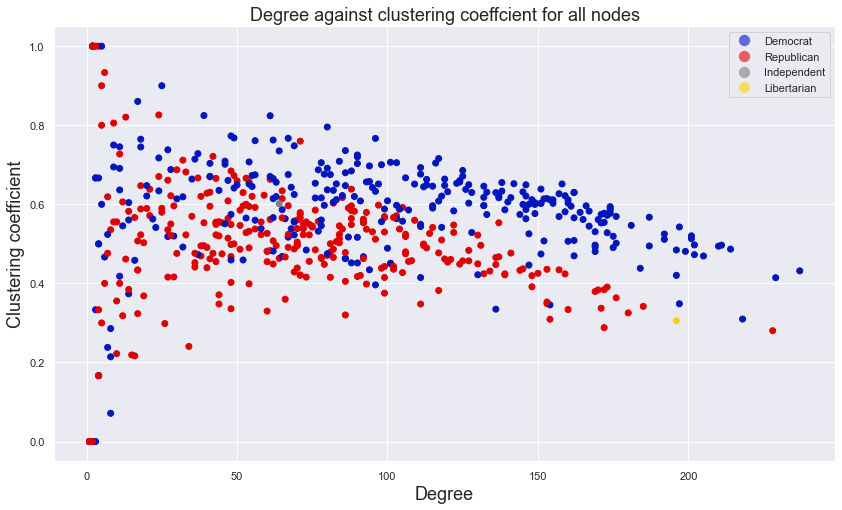

In [40]:
# Plot
plt.figure(figsize = (14,8))
plt.scatter(dict(UG.degree()).values(),nx.clustering(UG).values(),color = node_color)
plt.title('Degree against clustering coeffcient for all nodes', fontsize = 18)
plt.xlabel('Degree', fontsize = 18)
plt.ylabel('Clustering coefficient', fontsize = 18)
plt.legend(handles = [Line2D([0], [0], marker='o', color='#F5F5F5', label=Party,
                          markerfacecolor=col, markersize=12, alpha=0.6) for Party, col in color_dict_party.items()])
plt.show()

The plot gives a few interesting take aways. Firstly it seem to be a general pattern (at least for nodes with a degree of above 50) that republicans have a lower clustering coeeficient than the democrats. This means that the *density* in the republican part can be seen a lower compared to the democrats. Moreover, the clustering coefficient seems to drop slightly as the degree grows meaning the clustering can not *keep* up with the greater number of nodes that a node is connected to.

## Mixing patterns and Assortativity

In the initial analysis of the edges it was found how more likely politicians are to follow others from the own party compared to other parties. This is investigated further is this part where firstly the mixing pattern matrix for the undirected is shown below:

In [41]:
# Generate DF
mpdf_party = pd.DataFrame(data = nx.attribute_mixing_matrix(UG,'Party', mapping=dict(zip(color_dict_party.keys(),range(4)))), index = color_dict_party.keys(), columns = color_dict_party.keys())

# Add sum row/column
mpdf_party['Total'] = mpdf_party.sum(axis=1)
mpdf_party.loc['Total'] = mpdf_party.sum(axis=0)

# Show result
mpdf_party

,Democrat,Republican,Independent,Libertarian,Total
Democrat,0.549299,0.039399,0.001944,0.001222,0.591864
Republican,0.039399,0.359118,0.000501,0.002705,0.401723
Independent,0.001944,0.000501,0.000040,0.000000,0.002485
Libertarian,0.001222,0.002705,0.000000,0.000000,0.003928
Total,0.591864,0.401723,0.002485,0.003928,1.000000


These numbers are very similar to the edge investigation earlier - now just with normalised numbers. The matrix also clearly indicate that there are more democrat links where dem-dem account for 55% of the total but also in general that the graph is assortativity based on the party. The precise coefficient becomes:

In [42]:
print('Assortativity:',nx.attribute_assortativity_coefficient(UG, attribute = 'Party'))

Assortativity: 0.8125246538051577


So an assorsativity of 0.81, which is extremely high but not surprising given the structure of the graph. It really clearly tells that politicians from the same parties likes to link up.

From the plot it also looks like the senators are sepeareted from the representatives. Let's also investigate that mixing pattern and assotativity:

In [43]:
# Generate DF
mpdf_type = pd.DataFrame(data = nx.attribute_mixing_matrix(UG,'Type', mapping=dict(zip(shape_dict.keys(),range(3)))), index = shape_dict.keys(), columns = shape_dict.keys())

# Add sum row/column
mpdf_type['Total'] = mpdf_type.sum(axis=1)
mpdf_type.loc['Total'] = mpdf_type.sum(axis=0)

# Show result
print(mpdf_type)

print('\nAssortativity:',nx.attribute_assortativity_coefficient(UG, attribute = 'Type'))

                Representative   Senator    POTUS     Total
Representative        0.795311  0.054208  0.00004  0.849559
Senator               0.054208  0.096192  0.00000  0.150401
POTUS                 0.000040  0.000000  0.00000  0.000040
Total                 0.849559  0.150401  0.00004  1.000000

Assortativity: 0.5755683602872439


Again these number corrosponds with those seen from the earlier edge analysis - now just in the undirected version. The pattern is though the same. It is also clear that the assortativity is a good bit lower for the type-split even though 0.58 still is a clear positive assortativity meaning that the politicians like to link up to other politicians of the same type.

Lastly it the assortativity coefficient is checked based on the state-split, which is done below:

In [44]:
print(nx.attribute_assortativity_coefficient(UG, attribute = 'State'))

0.0654778890372143


A much lower value where only a slight positive assortativity is found. Off course there are also way more states, where many of them only have a few politician which off course makes it harder to find very high assortativity.

In [84]:
nx.degree_assortativity_coefficient(UG)

0.11737001063041216

Very slightly positicely assortative.

## Cliques

Let's have a look a the largest cliques in the data. For the analysis the largest clique from the full graph and the party-based sub graphs are extracted. It is a fairly time consuming task as the number of cliques grows exponentially with the graph and the density of the graph makes it even tougher. Of these reasons the anaylsis is limited to getting these largest cliques (it was previously found that there were 3M+ cliques in the democrated sub-graph alone.)

In [45]:
largest_clique_all = sorted(list(nx.find_cliques(UG)), key=len)[-1]
largest_clique_democrats = sorted(list(nx.find_cliques(UG_dem)), key=len)[-1]
largest_clique_repulicans = sorted(list(nx.find_cliques(UG_rep)), key=len)[-1]

Let's first investigate the sizes of the cliques by the number of elements in each of the lists.

In [46]:
print(f'The size of the largest clique in the full graph is {len(largest_clique_all)}')
print(f'The size of the largest clique in the democratic subgraph is {len(largest_clique_democrats)}')
print(f'The size of the largest clique in the republican subgraph is {len(largest_clique_repulicans)}')

The size of the largest clique in the full graph is 51
The size of the largest clique in the democratic subgraph is 51
The size of the largest clique in the republican subgraph is 33


Hmm, so the it is the same size for the full graph and democratic subgraph. Let's check if they are the same:

In [47]:
set(largest_clique_all) == set(largest_clique_democrats)

True

They are. Based on the analysis so far on the graph it is not surprising as it was not expected to have such a large clique across two graphs. It could have been suspected that an independent or libertarian was a part of it but it turned out not to be the case. Let's try to get a bit more info on the cliques based starting with the largest democratic clique. This is done by checing some different properties for the politicians in this clique. Let's first see the distribution of states.

In [48]:
Handle_data.loc[largest_clique_democrats].State.value_counts()

CA    12
NY     5
OH     3
VA     3
MD     3
MI     2
WI     2
WA     2
FL     2
PA     2
CT     2
TX     2
VT     1
AZ     1
MN     1
MO     1
SC     1
IL     1
ME     1
NJ     1
NH     1
MA     1
NM     1
Name: State, dtype: int64

There is not really any clear pattern seen from the states - there are many from New York and especially California but recalling the graph of politicians per party in each state it can not be seen as completely unproportioanl.

Now the type is checked:

In [49]:
Handle_data.loc[largest_clique_democrats].Type.value_counts()

Representative    51
Name: Type, dtype: int64

So it is representatives exclusively. Based on the illustration of the graph as well - as the fact that there are fewer senators - it is not that surprising that there are no senators in the clique. 

Lastly the degree of all the nodes in the cliques is checked:

In [50]:
print([UG.degree[politician] for politician in largest_clique_democrats])

[237, 211, 138, 214, 201, 202, 201, 202, 192, 196, 187, 172, 197, 162, 187, 157, 174, 167, 174, 160, 181, 171, 159, 158, 174, 157, 173, 174, 162, 175, 153, 161, 229, 138, 205, 199, 192, 175, 149, 172, 125, 164, 152, 146, 155, 162, 145, 154, 159, 151, 144]


Recall that the average degree is around 84 in the graph. The smallest degree across all members in the clique is 125 so there is a clear - and natural - correlation of a high degree being required to be in the largest clique.

Let's carry out the same analysis on the republican clique starting with the state distribution:

In [51]:
Handle_data.loc[largest_clique_repulicans].State.value_counts()

OH    4
TX    3
MI    3
AL    2
IL    2
TN    2
AR    2
PA    2
IN    2
NC    2
VA    1
AZ    1
NE    1
MN    1
GA    1
FL    1
SC    1
MS    1
WA    1
Name: State, dtype: int64

As with the democrats the is nothing here that looks completely out of proportions when keeping the total number of republicans in the state in mind. Moving onto the type:

In [52]:
Handle_data.loc[largest_clique_repulicans].Type.value_counts()

Representative    32
Senator            1
Name: Type, dtype: int64

Okay, now there is a single senator in the clique and that is

In [53]:
Handle_data.loc[largest_clique_repulicans][Handle_data.Type == 'Senator']

,State,Party,Type,Name,twitter_display_name
Twitter,,,,,
MarshaBlackburn,TN,Republican,Senator,Marsha Blackburn,Sen. Marsha Blackburn


So it is an Tennessean senator who actually is a part of this clique - maybe it is because she follows many in general, which is investigated below:

In [54]:
No_follow_dict[Handle_data.index[(Handle_data.index.isin(largest_clique_repulicans)) & (Handle_data.Type == 'Senator')][0]]

2286

Looking back and the graph of total number of following this is not such a large number, so the conclusion must be that Marsha Blackburn just follows many representatives compared to th general. She was quickly manually investigated an it turned out that she assumed office in the Senate in 2019 leaving the House of Representatives meaning she probably have followed these representatives before.

Lastly the total degree of all politicians in this largets republican cliques is investigated.

In [55]:
print([UG.degree[politician] for politician in largest_clique_repulicans])

[137, 173, 130, 169, 159, 150, 153, 170, 93, 131, 141, 145, 148, 176, 109, 122, 132, 99, 97, 71, 148, 112, 88, 172, 139, 119, 114, 124, 99, 118, 85, 103, 99]


The numbers are a bit lower than for the democrats and there is actually a node with degree 71, i.e. lower than the total average. Overall though, the degree is on aveage greater than the average degree for all nodes, looking at nodes in this clique.

## Centrality

### Closeness centrality

In [92]:
print(dict(sorted(dict(nx.closeness_centrality(UG)).items(), key = itemgetter(1), reverse = True)[:5]))
print(dict(sorted(dict(nx.closeness_centrality(UG)).items(), key = itemgetter(1), reverse = False)[:5]))

{'LeaderHoyer': 0.6079836233367452, 'SenatorSinema': 0.6055045871559633, 'RepSwalwell': 0.5975855130784709, 'GOPLeader': 0.5957873620862588, 'RepCheri': 0.5898709036742801}
{'FrancisRooney': 0.31345646437994723, 'TomTiffanyWI': 0.32160259880887926, 'VoteForTrey': 0.3217768147345612, 'ScottforFlorida': 0.32195121951219513, 'Tom_Suozzi': 0.3258365331870543}


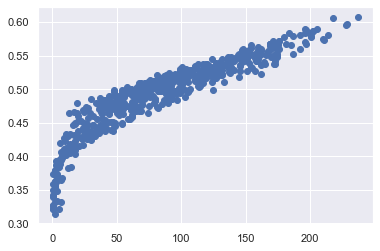

In [105]:
# Correlation plot
plt.scatter(dict(nx.degree(UG)).values(), nx.closeness_centrality(UG).values())

### Betweeness centrality

In [93]:
print(dict(sorted(dict(nx.betweenness_centrality(UG)).items(), key = itemgetter(1), reverse = True)[:5]))
print(dict(sorted(dict(nx.betweenness_centrality(UG)).items(), key = itemgetter(1), reverse = False)[:5]))

{'GOPLeader': 0.023591965552304608, 'SenatorSinema': 0.02026830627623982, 'justinamash': 0.020264090381997866, 'RepSwalwell': 0.020074632868570846, 'JohnCornyn': 0.018160273808632582}
{'DanaRohrabacher': 0.0, 'JohnFasoNY': 0.0, 'TeamReichert': 0.0, 'RepMcClintock': 0.0, 'RepLouCorrea': 0.0}


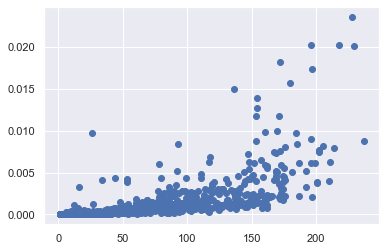

In [104]:
# Correlation plot
plt.scatter(dict(nx.degree(UG)).values(), nx.betweenness_centrality(UG).values())

### 

### Eigenvector centrality

In [94]:
print(dict(sorted(dict(nx.eigenvector_centrality(UG)).items(), key = itemgetter(1), reverse = True)[:5]))
print(dict(sorted(dict(nx.eigenvector_centrality(UG)).items(), key = itemgetter(1), reverse = False)[:5]))

{'LeaderHoyer': 0.10501113248685037, 'RepJerryNadler': 0.10067776897324979, 'RepSwalwell': 0.1001937267358903, 'WhipClyburn': 0.10007825399643228, 'RepBarbaraLee': 0.09940371252027454}
{'FrancisRooney': 1.7272494218475525e-05, 'TomTiffanyWI': 3.2580753251685537e-05, 'ScottforFlorida': 3.58953554478608e-05, 'VoteForTrey': 4.4978801952893824e-05, 'BuddforCongress': 5.404008633889923e-05}


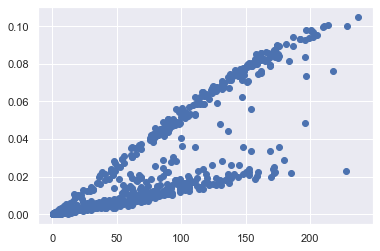

In [103]:
plt.scatter(dict(nx.degree(UG)).values(), nx.eigenvector_centrality(UG).values())

### Vote rank

In [109]:
nx.voterank(UG)[:10]

['LeaderHoyer',
 'GOPLeader',
 'RepSwalwell',
 'SenatorSinema',
 'RepJerryNadler',
 'WhipClyburn',
 'RepBarbaraLee',
 'RepCheri',
 'justinamash',
 'repmarkpocan']

# Community Detection

### Communities based on party

In [56]:
Democrats = [Handle for Handle,data in UG.nodes(data=True) if data['Party'] == "Democrat"]
Republican = [Handle for Handle,data in UG.nodes(data=True) if data['Party'] == "Republican"]

In [57]:
Party_combinations = [[i,j,k] for i in ["Democrat","Republican"] for j in ["Democrat","Republican"] for k in ["Democrat","Republican"]]

Politicians_Party_combs = [{Twitter: Party 
for Twitter, Party in zip(Handle_data[~Handle_data.Party.isin(["Democrat","Republican"])].index, Party_combs)
} for Party_combs in Party_combinations]

In [58]:
Modul_dict = {}

for combination in Politicians_Party_combs:
    tmp_democrat = Democrats + [Twitter for Twitter, Party in combination.items() if Party == "Democrat"]

    tmp_republic = Republican + [Twitter for Twitter, Party in combination.items() if Party == "Republican"]

    Modul_dict[str(combination)] = nx.algorithms.community.quality.modularity(UG, [tmp_democrat, tmp_republic])

In [59]:
{k: v for k, v in sorted(Modul_dict.items(), reverse = True,key=lambda item: item[1])}

{"{'SenAngusKing': 'Democrat', 'justinamash': 'Republican', 'SenSanders': 'Democrat'}": 0.39995215762185693,
 "{'SenAngusKing': 'Republican', 'justinamash': 'Republican', 'SenSanders': 'Democrat'}": 0.39987177882819747,
 "{'SenAngusKing': 'Democrat', 'justinamash': 'Republican', 'SenSanders': 'Republican'}": 0.39799823775808124,
 "{'SenAngusKing': 'Republican', 'justinamash': 'Republican', 'SenSanders': 'Republican'}": 0.397991850635138,
 "{'SenAngusKing': 'Democrat', 'justinamash': 'Democrat', 'SenSanders': 'Democrat'}": 0.39547301737744023,
 "{'SenAngusKing': 'Republican', 'justinamash': 'Democrat', 'SenSanders': 'Democrat'}": 0.3954127895068695,
 "{'SenAngusKing': 'Republican', 'justinamash': 'Democrat', 'SenSanders': 'Republican'}": 0.3935517528042056,
 "{'SenAngusKing': 'Democrat', 'justinamash': 'Democrat', 'SenSanders': 'Republican'}": 0.39353798900406023}

### Communities based on states

Will be done without Trump

In [60]:
UG_no_trump = UG.copy()
UG_no_trump.remove_node('realDonaldTrump')

In [61]:
states_set = set(v for k,v in UG_no_trump.nodes(data='State'))
handle_state_split = [[handle for handle, state in UG_no_trump.nodes(data='State') 
                        if state in state_selct] for state_selct in states_set]

# Calculate modularity
nx.algorithms.community.quality.modularity(UG_no_trump, handle_state_split)


0.0628734993413525

#### Trying to merge states

In [62]:
UG_adj = pd.DataFrame(data = nx.adjacency_matrix(UG_no_trump).todense(), index = UG_no_trump.nodes, columns = UG_no_trump.nodes)

In [63]:
StateDF = pd.DataFrame(data = 0, index = sorted(list(states_set)), columns = sorted(list(states_set)))

for idx in StateDF.index:
    for col in StateDF.columns:
        StateDF.loc[idx, col] = int(UG_adj.loc[
                                        [politician for politician in UG_adj.index if Handle_data.loc[politician, 'State'] == idx], [
                                        politician for politician in UG_adj.index if Handle_data.loc[politician, 'State'] == col]
                                ].sum().sum())

In [64]:
# Create graph
State_G = nx.from_numpy_matrix(StateDF.values)

# Because we use numpy, labels need to be reset
label_mapping = {idx: val for idx, val in enumerate(StateDF.columns)}
State_G = nx.relabel_nodes(State_G, label_mapping)

In [65]:
partition = community_louvain.best_partition(State_G, random_state=42)

In [66]:
partition_df = pd.DataFrame({
    'state' : [state for state in partition.keys()],
    'community': [str(community) for community in partition.values()]
})

In [67]:
# Color dict from https://sashamaps.net/docs/resources/20-colors/
color_dict_map = {
    0: '#e6194B', 1: '#3cb44b', 2: '#ffe119', 3:'#4363d8', 4:'#f58231', 5:'#911eb4', 
    6:'#42d4f4', 7:'#f032e6'
}

In [68]:
fig = px.choropleth(
    partition_df,
    locations='state',
    locationmode='USA-states',
    color="community",
    scope="usa",
)

fig.show()

In [69]:
# Overseas territory
{State: Clust for State, Clust in partition.items() if State in ['AS', 'GU', 'MP','PR','VI']}

{'AS': 0, 'GU': 1, 'MP': 1, 'PR': 0, 'VI': 1}

#### Check the partition in the original graph

In [70]:
State_split = [[politician for politician in UG_no_trump.nodes if partition[Handle_data.loc[politician, 'State']] == c] for c in set(partition.values())]

In [71]:
nx.algorithms.community.quality.modularity(UG_no_trump, State_split)

0.13403014714409084

Not particular well!

## Communities based on Type

As Trump is the only president in the data he will be ignored, i.e. the data without him will be used. With the vast amount of nodes it should not impact the modularity to a very large degree

In [72]:
Type_set = set(['Representative', 'Senator'])
handle_type_split = [[handle for handle, Type in UG_no_trump.nodes(data='Type') 
                        if Type in Type_selct] for Type_selct in Type_set]

# Calculate modularity
nx.algorithms.community.quality.modularity(UG_no_trump, handle_type_split)

0.14715213624778856

Not a very great partition either. This is probably because so many representatives from different parties are in the same community.

## Trying the Louvain

Not let's find the best partition based on the Louvain method.

In [73]:
best_par = community_louvain.best_partition(UG)
print(f"There are {max(best_par.values())+1} communities")

There are 3 communities


### Ivestigation of communities

In [74]:
from collections import Counter

In [75]:
# Reverse dict
communities_dict = {c: [politician for politician, community in best_par.items() if community == c] 
                    for c in set(best_par.values())}

# Get modularity
nx.algorithms.community.quality.modularity(UG, list(communities_dict.values()))

0.4476786221742082

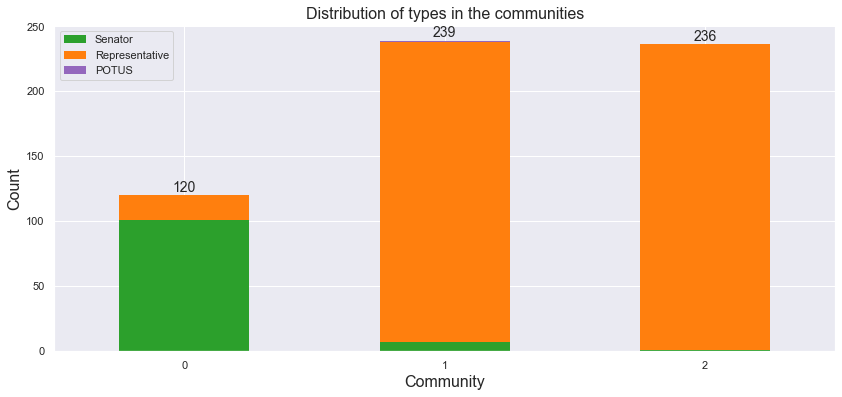

In [76]:
Types = Handle_data.Type.unique()
best_par_type = pd.DataFrame.from_dict({com: dict((x,[Handle_data.loc[politician, 'Type'] for politician in communities_dict[com]].count(x)) for x in Types) for com in communities_dict.keys()})

# Show results graphically
best_par_type.T.plot(
    kind='bar',
    stacked=True,
    figsize=(14,6), 
    color = ['tab:green', 'tab:orange', 'tab:purple'],
    linewidth = 0
)

# Add count
for x, count in enumerate(best_par_type.sum(axis=0).values):
    plt.text(x, count + 3 , int(count), fontsize=14, ha = 'center')

# Set parameters
plt.title("Distribution of types in the communities", fontsize = 16)
plt.xlabel("Community", fontsize = 16)
plt.xticks(rotation=0)
plt.ylabel("Count", fontsize = 16)
plt.show()

In [77]:
Handle_data.loc['JeffFlake', 'Type']

'Senator'

From these two stacked histograms it becomes very apparent that the ideal seperation of three communities are with a few errors, senators, republican representatives and democratic representatives. Now let's visualize it

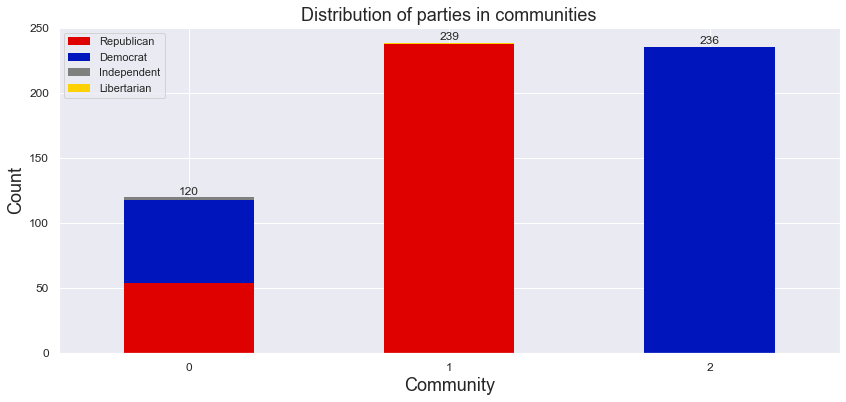

In [78]:
Parties = Handle_data.Party.unique()
best_par_party = pd.DataFrame.from_dict({com: dict((x,[Handle_data.loc[politician, 'Party'] for politician in communities_dict[com]].count(x)) for x in Parties) for com in communities_dict.keys()})

# Show results graphically
best_par_party.T.plot(
    kind='bar',
    stacked=True,
    figsize=(14,6), 
    color = color_dict_party,
    linewidth = 0
)

# Add counts
for x, count in enumerate([len(com) for com in communities_dict.values()]):
    plt.text(x, count + 2 , count, fontsize=12,  ha = 'center')

plt.xticks(rotation = 0, fontsize = 12)
plt.yticks(fontsize = 12)
plt.xlabel("Community", fontsize = 18)
plt.ylabel("Count", fontsize = 18)
plt.title("Distribution of parties in communities", fontsize = 18)
plt.show()

### Visualization of communities

In [79]:
color_dict_partition = {0: "#000000", 1: "tab:green", 2: "#B36305"}

In [80]:
color_partition = [color_dict_partition[c] for p,c in best_par.items()]

# Update colors
node_color = [color_dict_party[v] for k,v in nx.get_node_attributes(UG,'Party').items()]

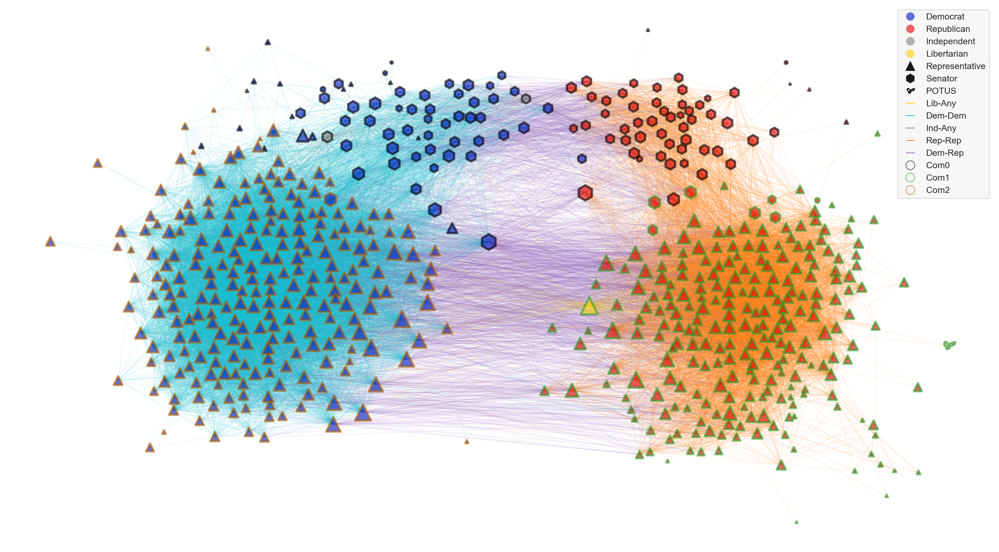

In [81]:
# Initialize
plt.figure(figsize=(24,13.5), dpi = 240)


# Draw graph
for i, node in enumerate(UG.nodes):
    nx.draw_networkx_nodes(
        G = UG,
        pos = positions,
        nodelist = [node],
        node_size = node_size[i],
        node_shape = node_shape[i],
        node_color = node_color[i],
        edgecolors = color_partition[i],
        linewidths= 3,
        alpha=0.6
    )

nx.draw_networkx_edges(
    G = UG,
    pos = positions,
    edge_color = edge_colors,
    alpha=0.1
)

# Legend
legend_elements = [Line2D([0], [0], marker='o', color='#F5F5F5', label=Party,
                          markerfacecolor=col, markersize=12, alpha=0.6) for Party, col in color_dict_party.items()]+\
                   [Line2D([0], [0], marker=Marker, color='k', label=Type,
                          markerfacecolor="k", linewidth=0, markersize=12, alpha=1) for Type, Marker in shape_dict.items()]+\
                              [Line2D([0], [0], marker="_", color=col, label=lab,
                          markerfacecolor=col, linewidth=0, markersize=12, alpha=1) for (col, lab) in zip(np.unique(edge_colors),
                            ['Lib-Any', 'Dem-Dem', 'Ind-Any', 'Rep-Rep', 'Dem-Rep'])]+\
                    [Line2D([0], [0], marker='o', color=col, label="Com" + str(com), markerfacecolor='#F5F5F5', markersize=12, 
                    linewidth=0, alpha=0.6) for com, col in color_dict_partition.items()]

plt.legend(handles = legend_elements, facecolor = "#F5F5F5", loc=0, fontsize = 12)

# Show and save
plt.axis('off')
plt.savefig('../figures/Follow_graph_partition.jpg', bbox_inches = 'tight', pad_inches = 0)
plt.show()

# Subconclusion

They like to follow folks from their own party.